Syeda Areeba Nadeem 21i-0307 <br>
Moawiz Bin Yamin 21i-0323 <br>
Hafiz Hammad Ahmed 21i-0343

In [83]:
import os
import cv2
import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt
import pandas as pd
from PIL import Image, ImageFilter
import networkx as nx 
from matplotlib.patches import Polygon
from scipy.optimize import linear_sum_assignment
import time
from skimage.metrics import structural_similarity as ssim

In [84]:
class Image_Similarity():
    
    def __init__(self, patch_size= (75, 75), resize_shape = (600, 600), features_weight = [1,1,1,1]):
        self.patch_size = patch_size
        self.resize_shape = resize_shape
        self.weight = features_weight
        self.fig_size = (7,7)
        
    def resize_image(self, image_path, to_gray=True):
        image = Image.open(image_path)
        if(to_gray):
            image = image.convert('L')
        image = image.resize(self.resize_shape)
        return cv2.GaussianBlur(np.array(image), (5, 5), 0, 0)

    def divide_into_patches(self, image): # non-overlapping patches
        patches = []
        for x in range(0, image.shape[0], self.patch_size[0]):
            for y in range(0, image.shape[1], self.patch_size[1]):
                patch = image[x:x+self.patch_size[0], y:y+self.patch_size[1]]
                patches.append(patch)
        return patches
    
    def detect_edges(self, patch, return_count=True):
        edges = cv2.Canny(patch, threshold1=70, threshold2=100) 
        edge_count = cv2.countNonZero(edges)
        
        if return_count:
            return edge_count
        else:
            return edges

    def detect_corners(self, patch, return_count=True):
        corners = cv2.cornerHarris(patch, blockSize=3, ksize=3, k=0.04)
        corner_count = np.sum(corners > 0.01 * corners.max())
    
        if return_count:
            return corner_count
        else:
            return corners
        
    def detect_lines_curves(self, patch, return_count=True): # straight lines
        edges = self.detect_edges(patch, return_count=False)
        lines = cv2.HoughLinesP(edges, rho=1, theta=np.pi/180, threshold=10, minLineLength=10, maxLineGap=1) # Probablistic Hough Line Transform
        line_count = len(lines) if lines is not None else 0

        if return_count:
            return line_count
        else:
            return lines

    def detect_smooth_regions(self, patch, return_count=True):
        _, binary = cv2.threshold(patch, 127, 255, cv2.THRESH_BINARY)
        contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        region_count = len(contours)
        
        if return_count:
            return region_count
        else:
            return contours
        
    def extract_features(self, image):
        patches = self.divide_into_patches(image)
        features = []
        
        for patch in patches:
            edge_count = self.detect_edges(patch) * self.weight[0] 
            line_count = self.detect_lines_curves(patch) * self.weight[1] 
            corner_count = self.detect_corners(patch) * self.weight[2] 
            region_count = self.detect_smooth_regions(patch) * self.weight[3]
            
            features.append((edge_count, corner_count, line_count, region_count))
            
        return features #(num_patches x 4)
    
    def calculate_similarity(self, features1, features2): #features1=>p1, features2=>p2 , p1 -> p2 edge: L2(f1,f2)
        return np.linalg.norm(np.array(features1) - np.array(features2))
    
    def create_adjacency_matrix(self, image_path): 
        image = self.resize_image(image_path)
        features = self.extract_features(image) #patch wise features => 64 x num_features => 64x3
        num_patches = len(features)
        adjacency_matrix = np.zeros((num_patches, num_patches)) # 64x64

        for i in range(num_patches):
            for j in range(num_patches):
                
                if(i == j):
                    adjacency_matrix[i][j] = 0
                else:
                    adjacency_matrix[i][j] = self.calculate_similarity(features[i], features[j])  
                    
        return adjacency_matrix     
     
    def visualize_edges(self, image_path):
        image = self.resize_image(image_path)
        patches = self.divide_into_patches(image)
        
        num_patches = image.shape[0] // self.patch_size[0]
        fig, axs = plt.subplots(num_patches, num_patches, figsize = self.fig_size)
        
        for row in range(num_patches):
            for col in range(num_patches):

                patch_index = row * num_patches + col
                edges = self.detect_edges(patches[patch_index], return_count=False)
                axs[row, col].imshow(edges, cmap='gray')
                axs[row, col].axis('off')
            
        plt.tight_layout()
        plt.show()
        
    def visualize_corners(self, image_path):
        image = self.resize_image(image_path)
        patches = self.divide_into_patches(image)
        
        num_patches = image.shape[0] // self.patch_size[0]
        fig, axs = plt.subplots(num_patches, num_patches, figsize = self.fig_size)
        
        for row in range(num_patches):
            for col in range(num_patches):

                patch_index = row * num_patches + col
                corners = self.detect_corners(patches[patch_index], return_count=False)
                axs[row, col].imshow(corners, cmap='gray')
                axs[row, col].axis('off')
            
        plt.tight_layout()
        plt.show()
    
    def visualize_lines_curves(self, image_path):
        image = self.resize_image(image_path)
        patches = self.divide_into_patches(image)

        num_patches = image.shape[0] // self.patch_size[0]
        fig, axs = plt.subplots(num_patches, num_patches, figsize = self.fig_size)

        for row in range(num_patches):
            for col in range(num_patches):
                
                patch_index = row * num_patches + col
                lines = self.detect_lines_curves(patches[patch_index], return_count=False)
                axs[row, col].imshow(patches[patch_index], cmap='gray') # Plot lines on the original patch

                if lines is not None:
                    for line in lines:
                        x1, y1, x2, y2 = line[0]
                        axs[row, col].plot([x1, x2], [y1, y2], color='red')

                axs[row, col].axis('off')

        plt.tight_layout()
        plt.show()
        
    def visualize_smooth_regions(self, image_path): 
        image = self.resize_image(image_path)
        patches = self.divide_into_patches(image)

        num_patches = image.shape[0] // self.patch_size[0]
        fig, axs = plt.subplots(num_patches, num_patches, figsize = self.fig_size) 
        
        for row in range(num_patches):
            for col in range(num_patches):

                patch_index = row * num_patches + col
                smooth_regions = self.detect_smooth_regions(patches[patch_index], return_count=False)
                axs[row, col].imshow(patches[patch_index], cmap='gray')  # Plot the original patch
                # Plot smooth regions
                for contour in smooth_regions:
                    polygon = Polygon(contour[:, 0, :], edgecolor='red', facecolor=(1, 0, 0, 0.3))  # Create a polygon from contour points
                    axs[row, col].add_patch(polygon)  # Add the polygon to the subplot
                axs[row, col].axis('off')
                
        plt.tight_layout()
        plt.show()
        
    def min_max_scale(self, matrix):
        min_val = np.min(matrix)
        max_val = np.max(matrix)
        scaled_matrix = (matrix - min_val) / (max_val - min_val)
        return scaled_matrix
        
    def Hungarian_algorithm(self, image_path_1, image_path_2, print_optimal_assignment=True): # returns similairty score
        graph_1 = self.create_adjacency_matrix(image_path_1) 
        graph_2 = self.create_adjacency_matrix(image_path_2) 

        # Calculating single cost matrix
        cost_matrix = np.zeros((graph_1.shape[0], graph_2.shape[0]))
        for i in range(graph_1.shape[0]):
            for j in range(graph_2.shape[0]):
                cost_matrix[i][j] = np.linalg.norm(graph_1[i] - graph_2[j]) 

        # normalizing cost matrix so that final answer is in range 0 to 1
        cost_matrix = self.min_max_scale(cost_matrix)
#         cost_matrix = (cost_matrix - np.mean(cost_matrix))/ np.std(cost_matrix)
        row_ind, col_ind = linear_sum_assignment(cost_matrix)

        if(print_optimal_assignment):
            print("Optimal Assignment:")
            for i in range(len(row_ind)):
                print(f"Node {row_ind[i]} in Graph 1 -> (is matched with) Node {col_ind[i]} in Graph 2 with (Cost: {cost_matrix[row_ind[i], col_ind[i]]})")

        total_cost = cost_matrix[row_ind, col_ind].sum()

        # Taking average similarity score to get a single value
        num_matches = len(row_ind)
        average_similarity_score = total_cost / num_matches

        return average_similarity_score
#         return 1 - np.tanh(average_similarity_score)
        
    def visualize_graphs(self, image_path_1, image_path_2):
        
        adj_1 = self.create_adjacency_matrix(image_path_1) 
        adj_2 = self.create_adjacency_matrix(image_path_2) 
        
        g1 = nx.from_numpy_array(adj_1)
        g2 = nx.from_numpy_array(adj_2)
    
        edge_colors = [plt.cm.viridis(i/len(g1.edges())) for i in range(len(g1.edges()))]
        node_colors_g1 = [plt.cm.viridis(i/len(g1.nodes())) for i in range(len(g1.nodes()))]
        node_colors_g2 = [plt.cm.plasma(i/len(g2.nodes())) for i in range(len(g2.nodes()))]

        plt.figure(figsize=(15, 8))

        plt.subplot(121)
        nx.draw(g1, pos=nx.spring_layout(g1), node_color=node_colors_g1, with_labels=True, node_size=1500, font_size=12, font_color='black', font_weight='bold', edge_color=edge_colors)
        plt.title(f'Graph g1')

        plt.subplot(122)
        nx.draw(g2, pos=nx.spring_layout(g2), with_labels=True, node_color=node_colors_g2, node_size=1500, font_size=12, font_color='black', font_weight='bold', edge_color=edge_colors)
        plt.title(f'Graph g2')

        plt.tight_layout()
        
    def visualize_images(self, image_1_path, image_2_path):
        image1 = self.resize_image(image_1_path, to_gray=False)
        image2 = self.resize_image(image_2_path, to_gray=False)

        plt.figure(figsize=(10, 5))

        plt.subplot(1, 2, 1)
        plt.imshow(image1, cmap='gray')
        plt.title(f'Image 1')
        plt.axis('off')

        plt.subplot(1, 2, 2)
        plt.imshow(image2, cmap='gray')
        plt.title(f'Image 2')
        plt.axis('off')

        plt.show()

Score : 0.0


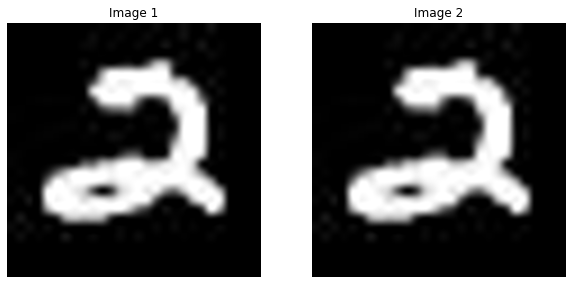

In [101]:
# image_1_path = './chicago-200445_1280.jpg'
# image_2_path = './city-gcc098c58c_1920.jpg'

image_1_path = './numbers/two/img_1.jpg'
image_2_path = './numbers/two/img_10132.jpg'
image_3_path = './numbers/one/img_115.jpg'

# image_2_path = './numbers/three/img_10.jpg'
# image_2_path = './numbers/four/img_1066.jpg'
# image_2_path = './numbers/five/img_11.jpg'
# image_2_path = './numbers/six/img_1012.jpg'
# image_2_path = './numbers/seven/img_12.jpg'
image_2_path = './numbers/eight/img_1033.jpg'
# image_2_path = './numbers/nine/img_1120.jpg'


IS = Image_Similarity(patch_size=(100,100), resize_shape=(500,500), features_weight=[1,0,0,0])
print(f"Score : {IS.Hungarian_algorithm(image_1_path, image_1_path, False)}")
IS.visualize_images(image_1_path, image_1_path)

Score : 0.297546948517391


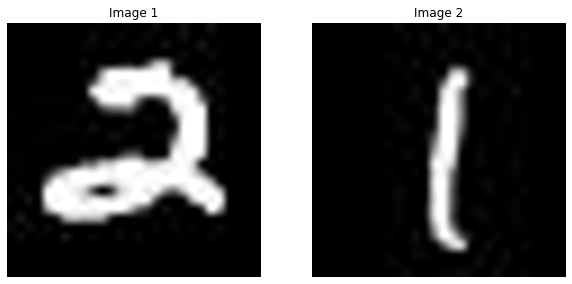

In [102]:
print(f"Score : {IS.Hungarian_algorithm(image_1_path, image_3_path, False)}")
IS.visualize_images(image_1_path, image_3_path)

In [103]:
# IS.visualize_graphs(image_1_path, image_2_path)

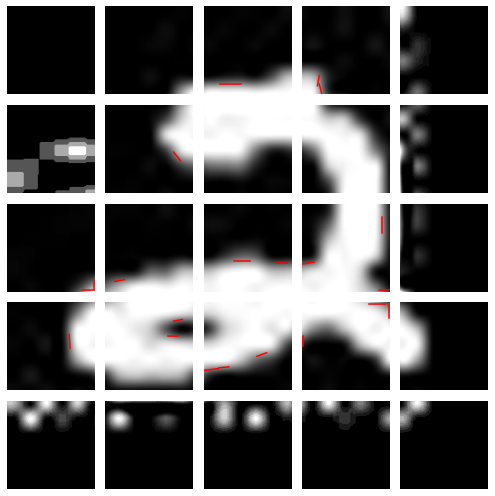

In [104]:
IS.visualize_lines_curves(image_1_path)

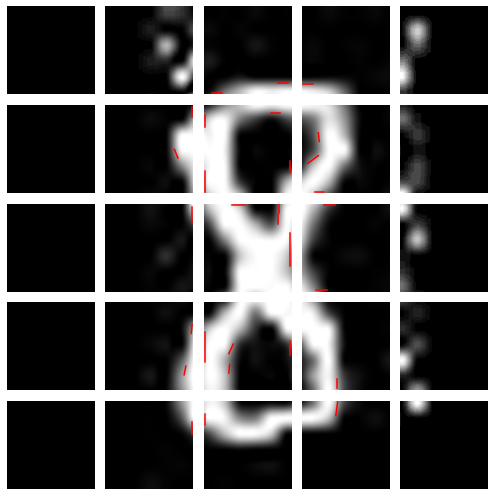

In [105]:
IS.visualize_lines_curves(image_2_path)

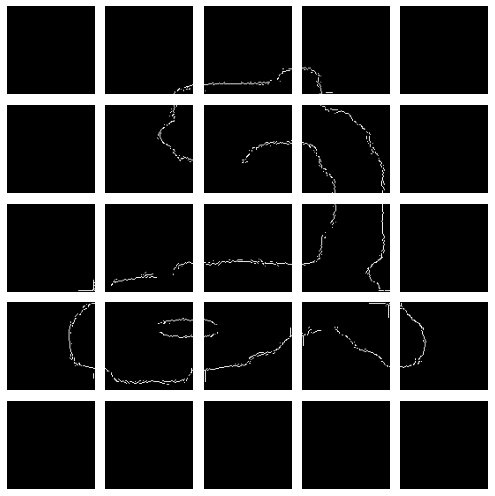

In [106]:
IS.visualize_edges(image_1_path)

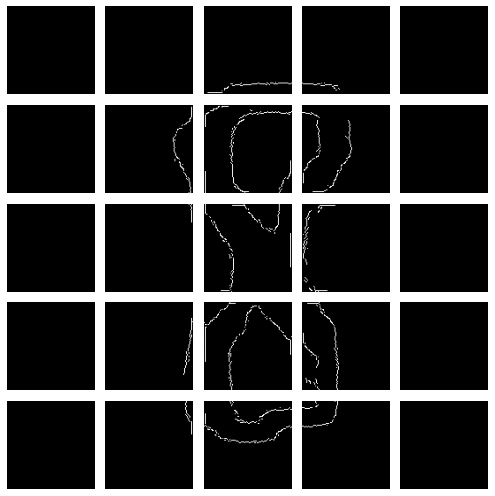

In [107]:
IS.visualize_edges(image_2_path)

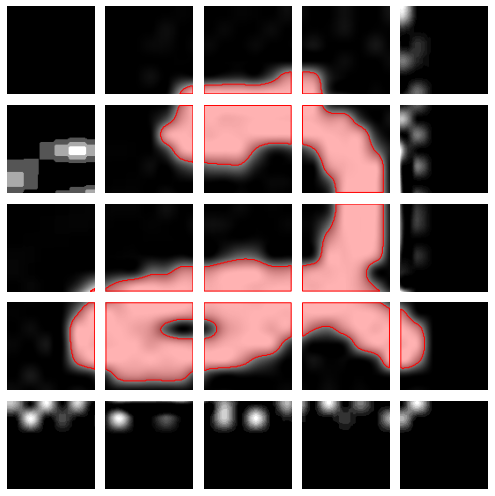

In [108]:
IS.visualize_smooth_regions(image_1_path)

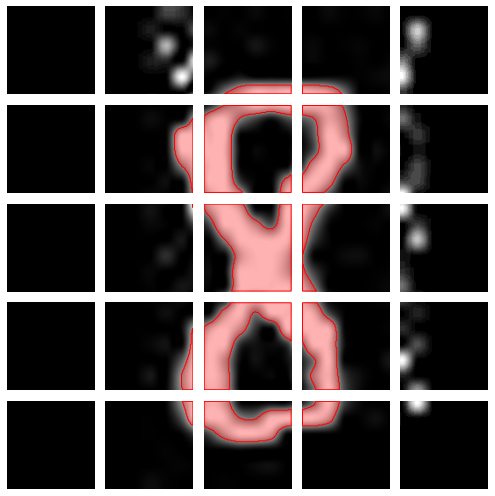

In [109]:
IS.visualize_smooth_regions(image_2_path)

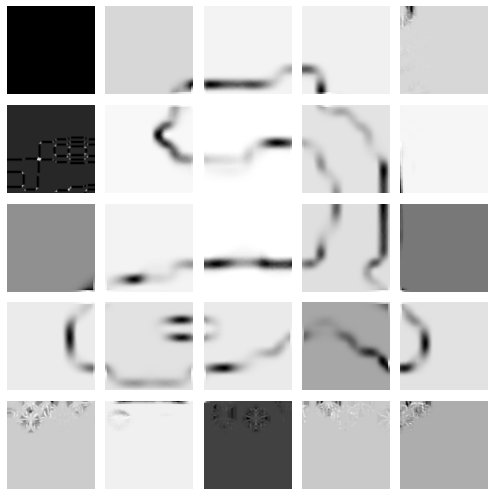

In [110]:
IS.visualize_corners(image_1_path)

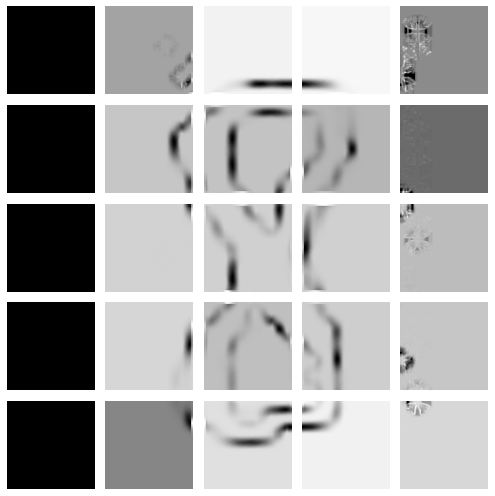

In [111]:
IS.visualize_corners(image_2_path)

# Comparison

In [112]:
def open_image(image_path, resize_shape=(400,400)):
    image = Image.open(image_path).convert('L')
    image = image.resize(resize_shape)
    return np.array(image)

In [125]:
#SSIM is measured on a scale from 0 to 1, where the closer the score is to 1, the more similar the degraded image is to the reference image.
def calculate_ssim(image1, image2): # -1 to 1
    ssim_index = ssim(image1, image2, data_range=255)
    return ssim_index

In [126]:
def calculate_rmse(image1, image2): # range : 0 - +ve inf
    return np.sqrt(np.mean((image1 - image2) ** 2))

In [127]:
# Peak Signal-to-Noise Ratio (PSNR)
def calculate_psnr(image1, image2): 
    mse = np.mean((image1 - image2) ** 2) 
    if (mse == 0):  # MSE is zero means similar images
        return 100 # means similar
    
    max_pixel = 255.0
    psnr = 20 * np.log10(max_pixel / np.sqrt(mse)) 
    return psnr 

We usually use psnr to measure the quality of a compressed image compared to the original image. A higher value of psnr is better. (since it is being divided by mse so if mse i.e. the difference between 2 images is less, then psnr is high)

In [128]:
def calculate_issm(image1, image2):

    def shannon_entropy(p):
        entropy = -np.sum(p * np.log2(p + 1e-6))
#         print("Entropy: ", entropy)  
        return entropy

    def reshape_histogram(hist):
        return hist.flatten()

    def ehs(hist):
        hist_normalized = hist / np.sum(hist)  # Normalize the histogram
        hist_1d = reshape_histogram(hist_normalized)
        return shannon_entropy(hist_1d)

    def canny_edge_detection(image):
        return cv2.Canny(image.astype('uint8'), 100, 200)

    joint_hist, _, _ = np.histogram2d(image1.flatten(), image2.flatten(), bins=(256, 256))
#     print("Joint histogram sum before normalization:", np.sum(joint_hist))  

    EHS_value = ehs(joint_hist)
#     print("EHS Value: ", EHS_value)

    edges1 = canny_edge_detection(image1)
    edges2 = canny_edge_detection(image2)
    edge_diff = np.mean(np.abs(edges1 - edges2))
#     print("Edge difference mean: ", edge_diff)  

    # Combine EHS and edge information
    ISSM_score = 0.5 * EHS_value + 0.5 * edge_diff
    return ISSM_score

In [145]:
img1 = open_image(image_1_path)
img2 = open_image(image_2_path)

SSIM = calculate_ssim(img1, img2)
PSNR = calculate_psnr(img1, img2)
RMSE = calculate_rmse(img1, img2)
ISSM = calculate_issm(img1, img2)

print(f"SSIM :\t{SSIM}")
print(f"PSNR :\t{PSNR}")
print(f"RMSE :\t{RMSE}")
print(f"ISSM :\t{ISSM}")
print(f"Graph: \t{IS.Hungarian_algorithm(image_1_path,image_2_path, print_optimal_assignment=False)}")

SSIM :	0.5207163006384474
PSNR :	31.899718512289557
RMSE :	6.479690386121855
ISSM :	3.829219535829817
Graph: 	0.17873237104021272


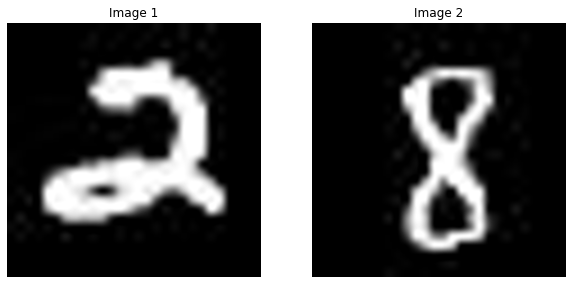

In [130]:
IS.visualize_images(image_1_path,image_2_path)

# Testing & Accuracy

In [131]:
df = pd.DataFrame(columns=['Folder_name', 'File_path'])

BASE_PATH = './numbers/'
idx=0
for folder in os.listdir(BASE_PATH):
    folder_path = BASE_PATH + folder
    folder_name = folder_path.split('/')[-1]
    for img in os.listdir(folder_path):
        df.loc[idx, 'Folder_name'] = folder_name
        df.loc[idx, 'File_path'] = folder_path + '/' + img
        idx +=1
        
df

,Folder_name,File_path
0,eight,./numbers/eight/img_1033.jpg
1,eight,./numbers/eight/img_110.jpg
2,eight,./numbers/eight/img_1133.jpg
3,eight,./numbers/eight/img_1137.jpg
4,eight,./numbers/eight/img_124.jpg
5,five,./numbers/five/img_11.jpg
6,five,./numbers/five/img_12297.jpg
7,five,./numbers/five/img_12317.jpg
8,five,./numbers/five/img_12325.jpg
9,five,./numbers/five/img_12329.jpg


In [132]:
categories = df['Folder_name'].unique()
categories

array(['eight', 'five', 'four', 'nine', 'one', 'seven', 'six', 'three',
       'two', 'zero'], dtype=object)

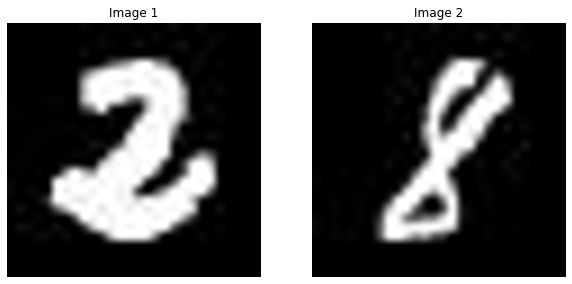

SSIM :	0.5613013541540631
PSNR :	32.11688815037416
RMSE :	6.319689964705548
ISSM :	3.9044150352381792
Graph Score: 0.23653854682538417
------------------------------------------------------------------------------------


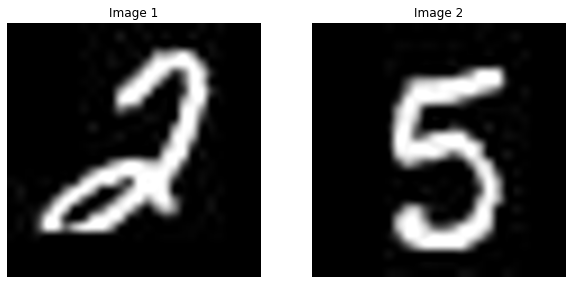

SSIM :	0.5168425596309298
PSNR :	31.935201667559646
RMSE :	6.45327387842791
ISSM :	3.8645806387213506
Graph Score: 0.17414342290440626
------------------------------------------------------------------------------------


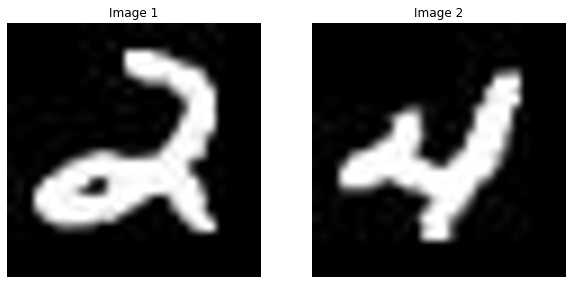

SSIM :	0.5798402973959241
PSNR :	32.14545569655011
RMSE :	6.298938898735247
ISSM :	3.9677129576985433
Graph Score: 0.1230567282028271
------------------------------------------------------------------------------------


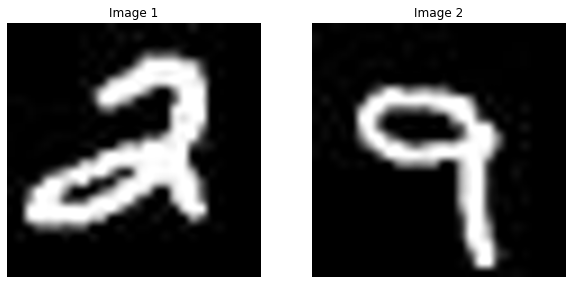

SSIM :	0.46360296457173317
PSNR :	31.555514302196748
RMSE :	6.741623042710116
ISSM :	4.113412072512913
Graph Score: 0.21110846315700432
------------------------------------------------------------------------------------


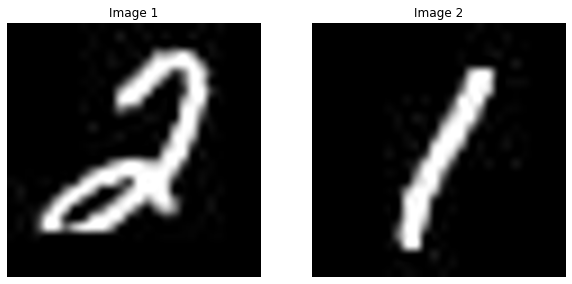

SSIM :	0.5520459372684444
PSNR :	32.71474910286407
RMSE :	5.899330470485613
ISSM :	3.3250060967182846
Graph Score: 0.1518642098302171
------------------------------------------------------------------------------------


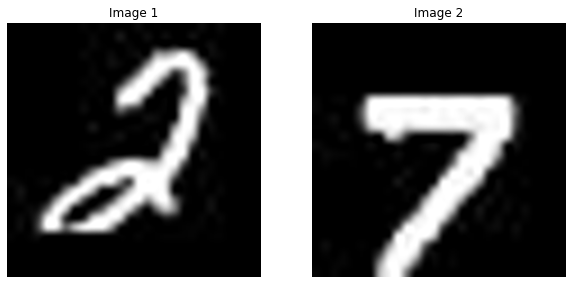

SSIM :	0.5030895783348115
PSNR :	31.916003480245713
RMSE :	6.467553150148826
ISSM :	3.7867169695865677
Graph Score: 0.14148269290842236
------------------------------------------------------------------------------------


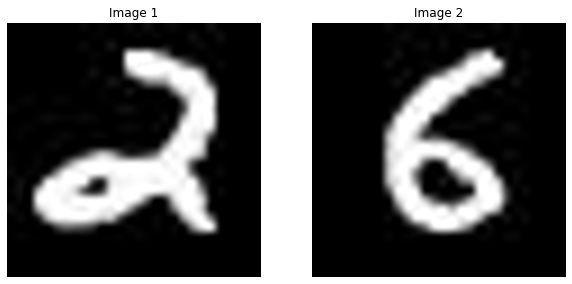

SSIM :	0.5265649423062996
PSNR :	32.01694452310453
RMSE :	6.392827035044824
ISSM :	3.918720299055053
Graph Score: 0.11956075702859925
------------------------------------------------------------------------------------


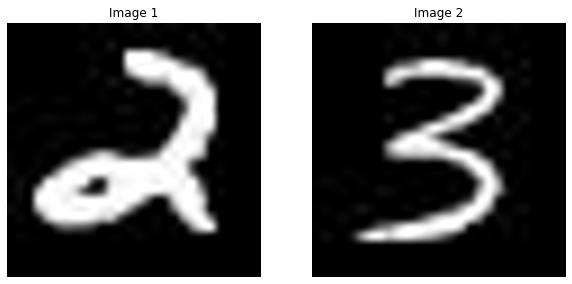

SSIM :	0.4927689754882619
PSNR :	31.767535368924705
RMSE :	6.579053408355946
ISSM :	4.014590008343513
Graph Score: 0.10101705174598241
------------------------------------------------------------------------------------


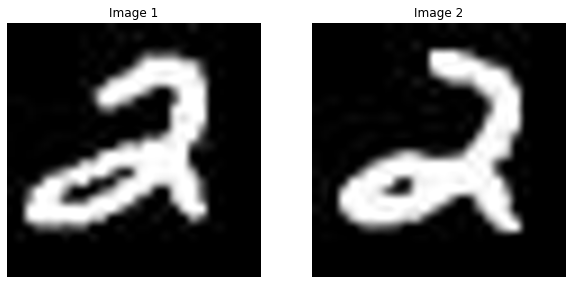

SSIM :	0.6676052957914218
PSNR :	32.33032339426494
RMSE :	6.166290923237405
ISSM :	4.045978859314863
Graph Score: 0.06801049827243173
------------------------------------------------------------------------------------


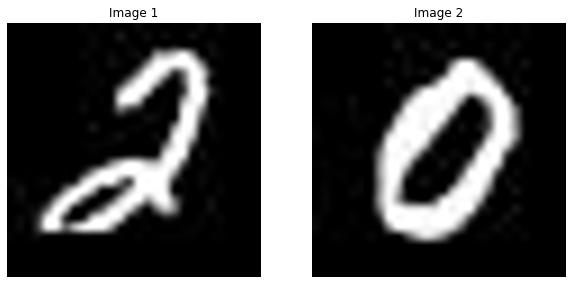

SSIM :	0.5727210355264359
PSNR :	32.124292234895904
RMSE :	6.3143051874295715
ISSM :	3.9968407578107916
Graph Score: 0.14570749916019982
------------------------------------------------------------------------------------


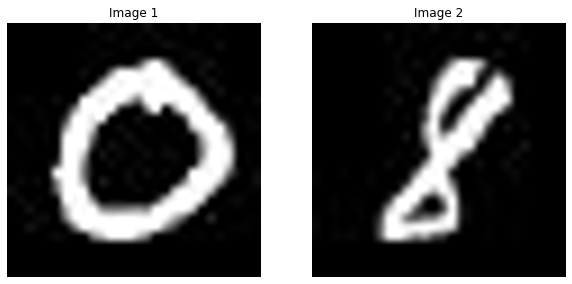

SSIM :	0.48208227039497675
PSNR :	31.702565092354874
RMSE :	6.628449102165604
ISSM :	4.397727857540209
Graph Score: 0.27837284741870433
------------------------------------------------------------------------------------


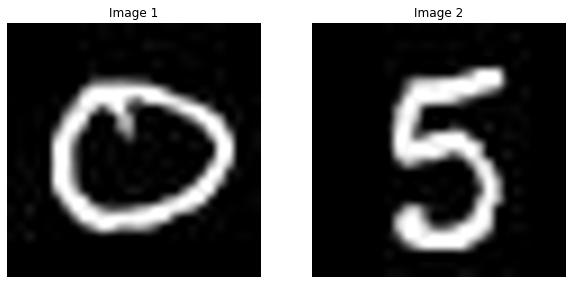

SSIM :	0.46402596951245556
PSNR :	31.66620329515436
RMSE :	6.656255985912801
ISSM :	4.049671392573748
Graph Score: 0.2027964208765539
------------------------------------------------------------------------------------


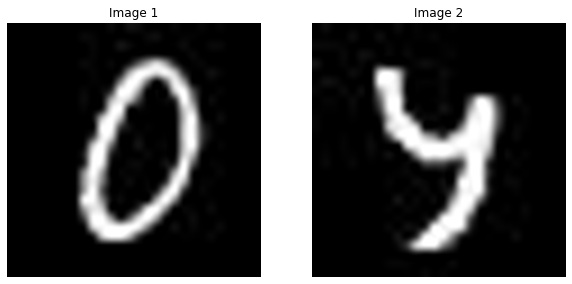

SSIM :	0.5522590498724231
PSNR :	32.33875160905684
RMSE :	6.1603104629555805
ISSM :	3.581109798947559
Graph Score: 0.14860203428708457
------------------------------------------------------------------------------------


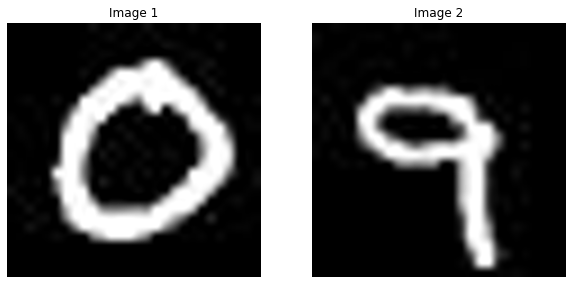

SSIM :	0.3899525530127599
PSNR :	31.35882348367749
RMSE :	6.896027842171173
ISSM :	4.512850329077888
Graph Score: 0.27623366760402673
------------------------------------------------------------------------------------


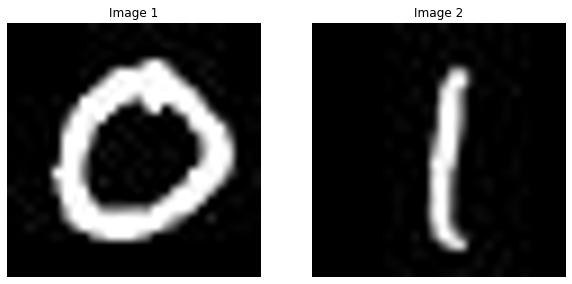

SSIM :	0.4499272156688898
PSNR :	31.962468460420894
RMSE :	6.433047489331941
ISSM :	4.1628385716420295
Graph Score: 0.4510617939873701
------------------------------------------------------------------------------------


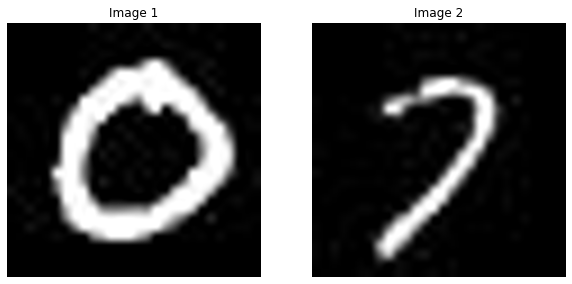

SSIM :	0.4698302391687683
PSNR :	31.775215991761463
RMSE :	6.5732383571569954
ISSM :	4.460614986850122
Graph Score: 0.2694267631116583
------------------------------------------------------------------------------------


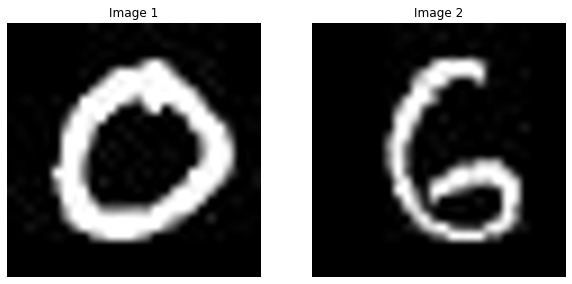

SSIM :	0.4854772779301517
PSNR :	31.86244636242248
RMSE :	6.507555224506358
ISSM :	4.317697228240951
Graph Score: 0.1342871658479862
------------------------------------------------------------------------------------


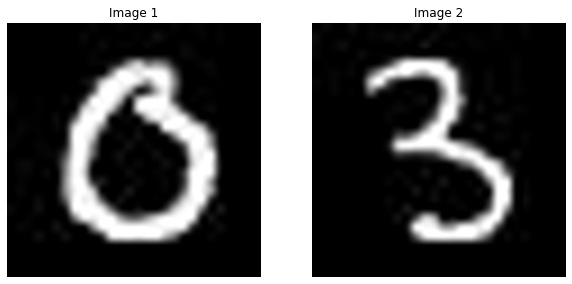

SSIM :	0.5313441199203087
PSNR :	31.98552834563376
RMSE :	6.415991252331942
ISSM :	4.038876068483226
Graph Score: 0.13279723666268178
------------------------------------------------------------------------------------


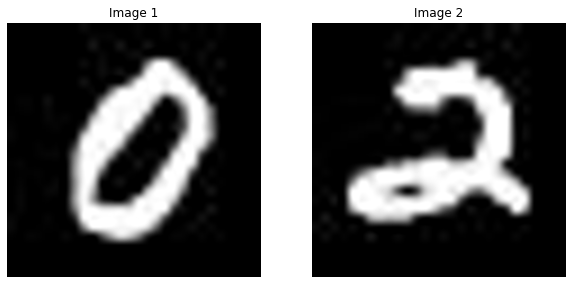

SSIM :	0.5689020241022528
PSNR :	31.95913519665121
RMSE :	6.435516684773647
ISSM :	4.045992235570323
Graph Score: 0.1302083127830364
------------------------------------------------------------------------------------


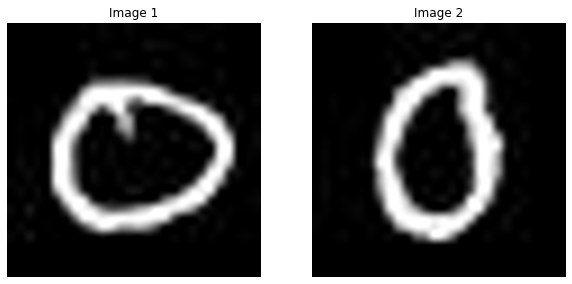

SSIM :	0.5184465147629843
PSNR :	31.877819964041656
RMSE :	6.496047355892658
ISSM :	4.130720953495357
Graph Score: 0.08269622109677027
------------------------------------------------------------------------------------


In [133]:
import random

for c1 in categories[8:]:
    for c2 in categories:
        i1 = random.choice(df[df['Folder_name'] == c1]['File_path'].index)
        i2 = random.choice(df[df['Folder_name'] == c2]['File_path'].index)
        IS.visualize_images(df.iloc[i1]['File_path'], df.iloc[i2]['File_path'])
        score = IS.Hungarian_algorithm(df.iloc[i1]['File_path'], df.iloc[i2]['File_path'], print_optimal_assignment=False)
        
        img1 = open_image(df.iloc[i1]['File_path'])
        img2 = open_image(df.iloc[i2]['File_path'])

        SSIM = calculate_ssim(img1, img2)
        PSNR = calculate_psnr(img1, img2)
        RMSE = calculate_rmse(img1, img2)
        ISSM = calculate_issm(img1, img2)

        print(f"SSIM :\t{SSIM}")
        print(f"PSNR :\t{PSNR}")
        print(f"RMSE :\t{RMSE}")
        print(f"ISSM :\t{ISSM}")
        print(f"Graph Score: {score}")
        print('------------------------------------------------------------------------------------')

In [134]:
DF = pd.read_csv('./Dataset.csv')
DF

,File_name,Folder_name,File_path
0,2208.jpg,dew,./dataset/dew/2208.jpg
1,2209.jpg,dew,./dataset/dew/2209.jpg
2,2210.jpg,dew,./dataset/dew/2210.jpg
3,2211.jpg,dew,./dataset/dew/2211.jpg
4,2212.jpg,dew,./dataset/dew/2212.jpg
...,...,...,...
6857,1446.jpg,snow,./dataset/snow/1446.jpg
6858,1447.jpg,snow,./dataset/snow/1447.jpg
6859,1448.jpg,snow,./dataset/snow/1448.jpg
6860,1449.jpg,snow,./dataset/snow/1449.jpg


In [135]:
categories = DF['Folder_name'].unique()
categories

array(['dew', 'fogsmog', 'frost', 'glaze', 'hail', 'lightning', 'rain',
       'rainbow', 'rime', 'sandstorm', 'snow'], dtype=object)

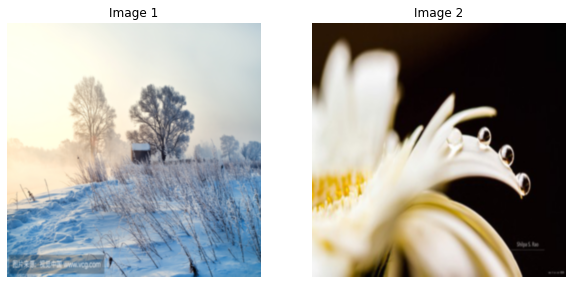

Graph Score: 0.45456498785315214
------------------------------------------------------------------------------------


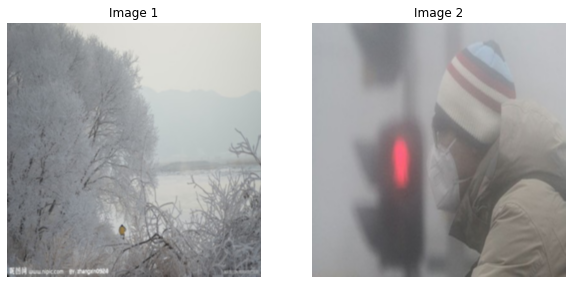

Graph Score: 0.27578062500075085
------------------------------------------------------------------------------------


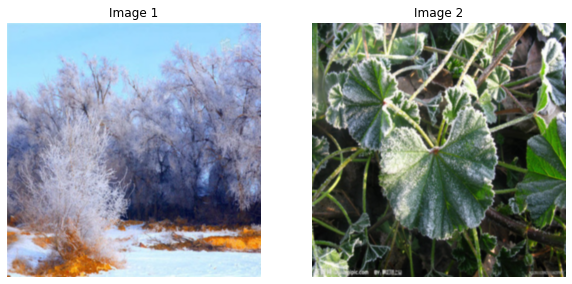

Graph Score: 0.30927916115179577
------------------------------------------------------------------------------------


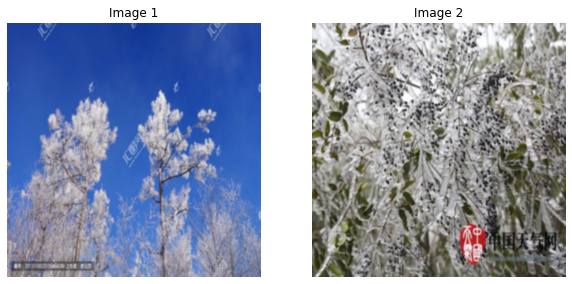

Graph Score: 0.4438591591247916
------------------------------------------------------------------------------------


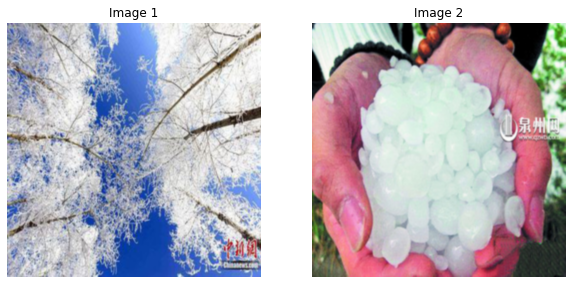

Graph Score: 0.22475759358195732
------------------------------------------------------------------------------------


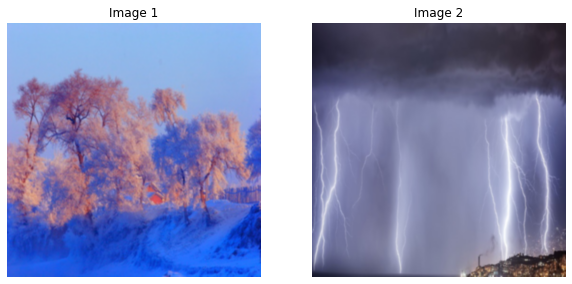

Graph Score: 0.2763020152750419
------------------------------------------------------------------------------------


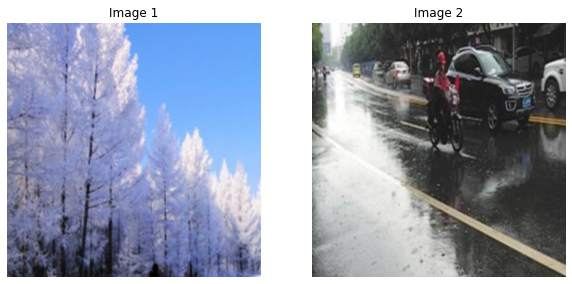

Graph Score: 0.2492403996827915
------------------------------------------------------------------------------------


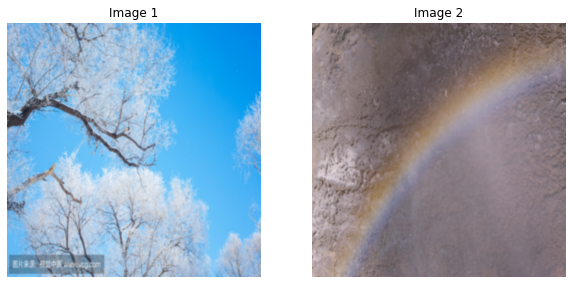

Graph Score: 0.3828023518871204
------------------------------------------------------------------------------------


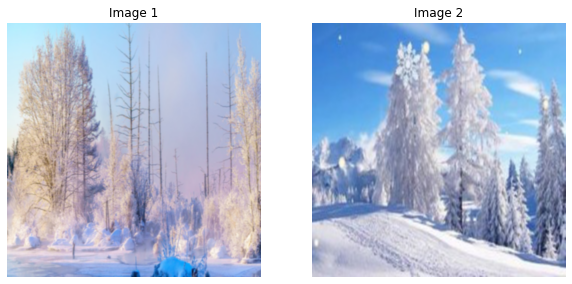

Graph Score: 0.3131603445856406
------------------------------------------------------------------------------------


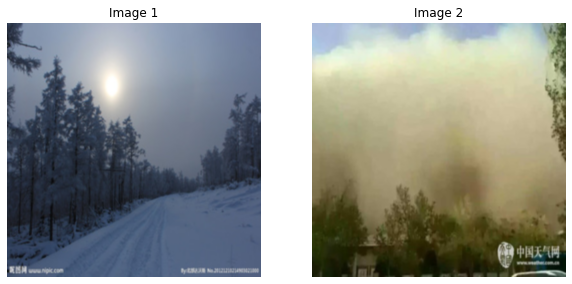

Graph Score: 0.29420600933624047
------------------------------------------------------------------------------------


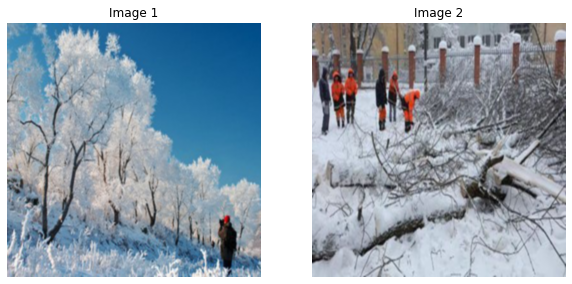

Graph Score: 0.11716296777543106
------------------------------------------------------------------------------------


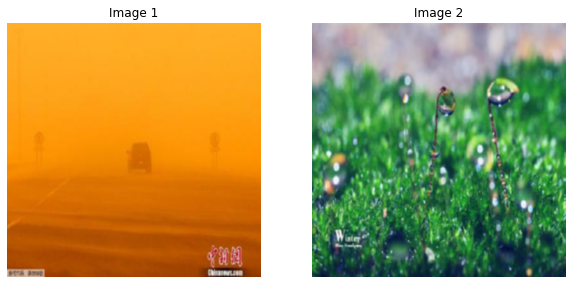

Graph Score: 0.5150591141405134
------------------------------------------------------------------------------------


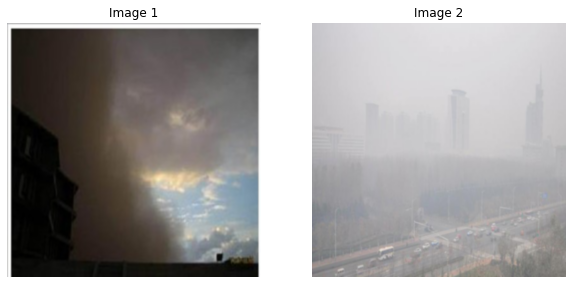

Graph Score: 0.23445070310053645
------------------------------------------------------------------------------------


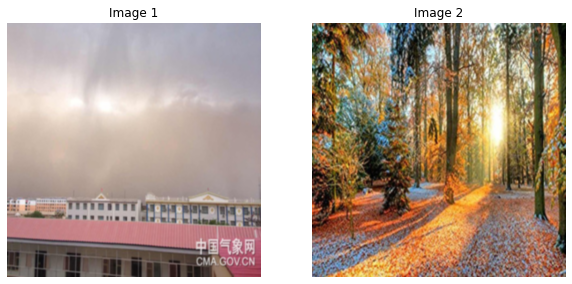

Graph Score: 0.23375057984678763
------------------------------------------------------------------------------------


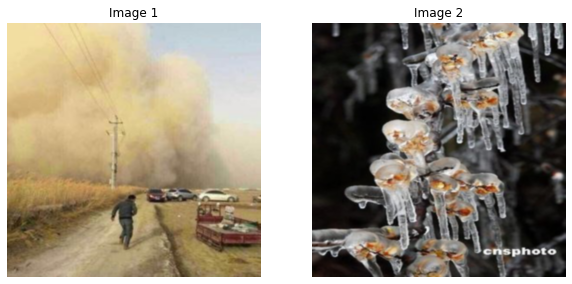

Graph Score: 0.5159991460194636
------------------------------------------------------------------------------------


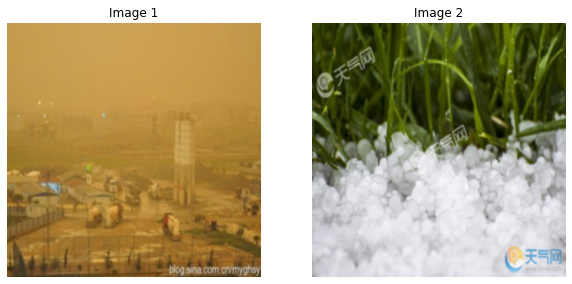

Graph Score: 0.18496963917116008
------------------------------------------------------------------------------------


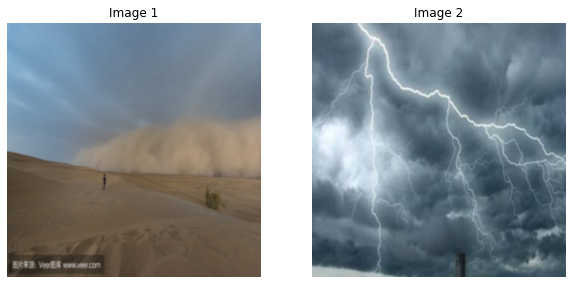

Graph Score: 0.24339434175090083
------------------------------------------------------------------------------------


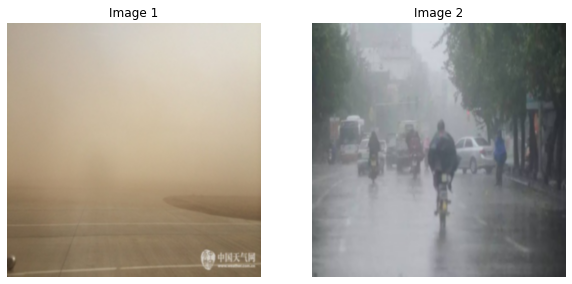

Graph Score: 0.18138867455463079
------------------------------------------------------------------------------------


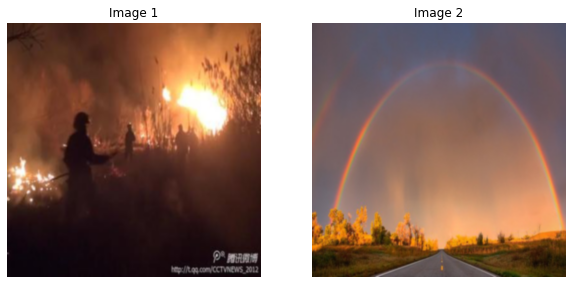

Graph Score: 0.23426970854142046
------------------------------------------------------------------------------------


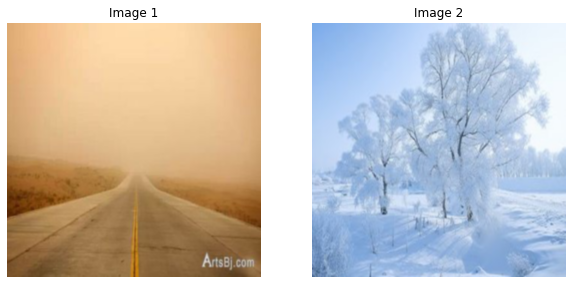

Graph Score: 0.4986828938521418
------------------------------------------------------------------------------------


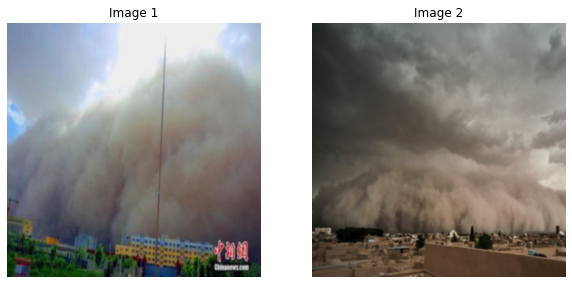

Graph Score: 0.05642125398963559
------------------------------------------------------------------------------------


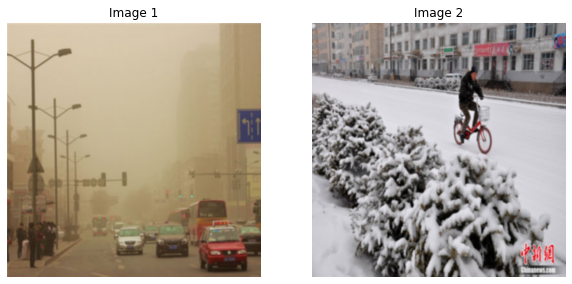

Graph Score: 0.23761103574396042
------------------------------------------------------------------------------------


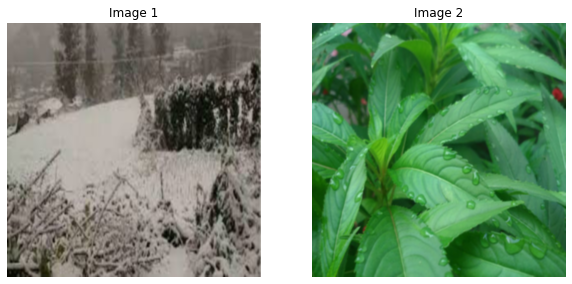

Graph Score: 0.5418114743369495
------------------------------------------------------------------------------------


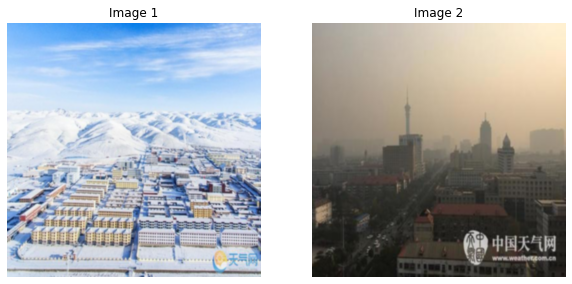

Graph Score: 0.5087777762887155
------------------------------------------------------------------------------------


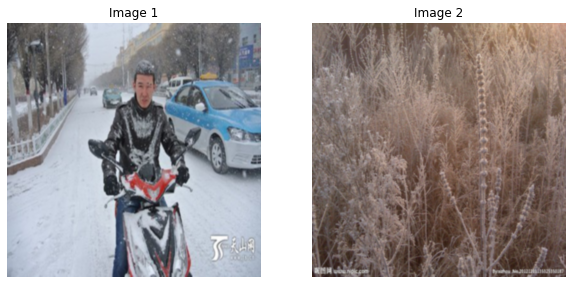

Graph Score: 0.3074047501511891
------------------------------------------------------------------------------------


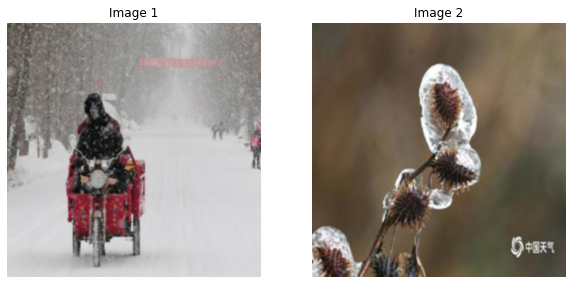

Graph Score: 0.3347995568523157
------------------------------------------------------------------------------------


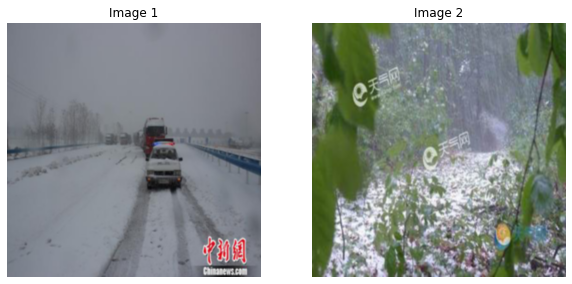

Graph Score: 0.3527779523157982
------------------------------------------------------------------------------------


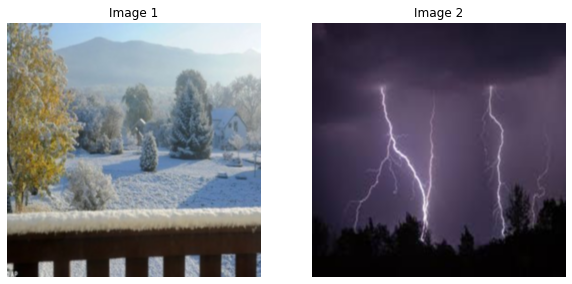

Graph Score: 0.4542687437132987
------------------------------------------------------------------------------------


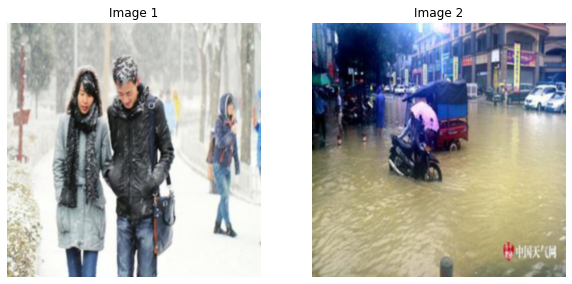

Graph Score: 0.36497319263437406
------------------------------------------------------------------------------------


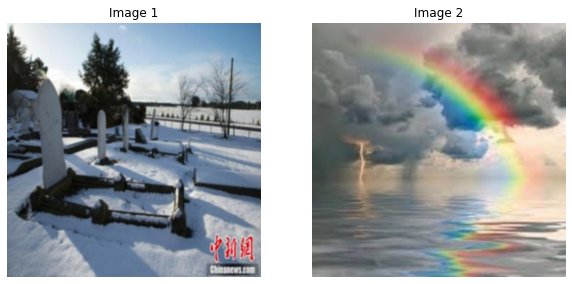

Graph Score: 0.16807350278225333
------------------------------------------------------------------------------------


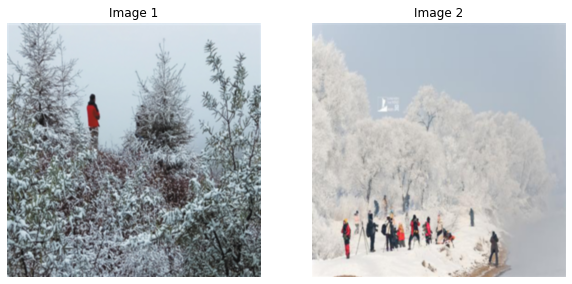

Graph Score: 0.36142336611032727
------------------------------------------------------------------------------------


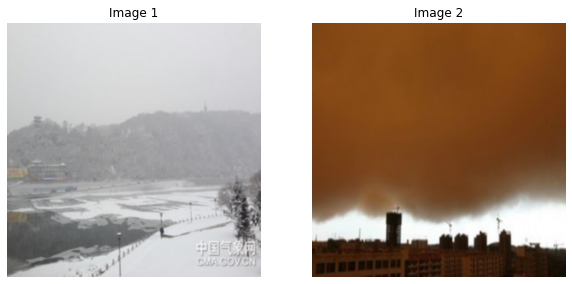

Graph Score: 0.20770881460046506
------------------------------------------------------------------------------------


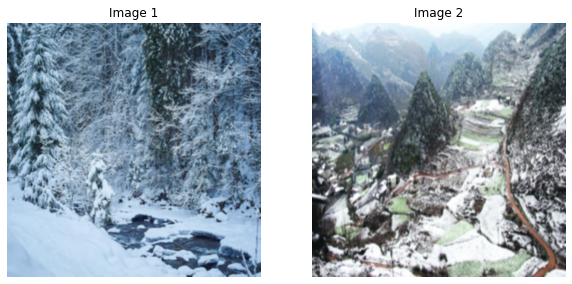

Graph Score: 0.3574339338103533
------------------------------------------------------------------------------------


In [136]:
import random

for c1 in categories[8:]:
    for c2 in categories:
        i1 = random.choice(DF[DF['Folder_name'] == c1]['File_path'].index)
        i2 = random.choice(DF[DF['Folder_name'] == c2]['File_path'].index)
        IS.visualize_images(DF.iloc[i1]['File_path'], DF.iloc[i2]['File_path'])
        score = IS.Hungarian_algorithm(DF.iloc[i1]['File_path'], DF.iloc[i2]['File_path'], print_optimal_assignment=False)
        print(f"Graph Score: {score}")
        print('------------------------------------------------------------------------------------')

In [137]:
Path = './Test/'
for i in os.listdir(Path):
    print(i)

buildings_1.jpg
buildings_2.jpg
drought.jpg
flood.jpg
grass_rain.jpg
grass_sun.jpg
Mountain.jpg
nine.jpg
ocean.jpg
plain.jpg
seven_1.jpg
seven_2.jpg
tree_1.jpg
tree_2.jpg


In [138]:
l1 = ['buildings_1.jpg','buildings_1.jpg', 'flood.jpg', 'flood.jpg', 'seven_1.jpg', 'seven_1.jpg', 'tree_1.jpg', 'grass_rain.jpg', 'tree_1.jpg', 'plain.jpg']
l2 = ['buildings_1.jpg', 'buildings_2.jpg', 'drought.jpg', 'ocean.jpg', 'seven_2.jpg', 'nine.jpg', 'tree_2.jpg', 'grass_sun.jpg', 'grass_sun.jpg', 'Mountain.jpg']
true_score = [0, 0.5, 1, 0.4, 0, 0.6, 0.2, 0.3, 0.8, 1]
true_label = [1, 1, -1, 1, 1, 1, -1, 1, -1, -1]

test_df = pd.DataFrame(columns=['Image_1', 'Image_2', 'Scores', 'Labels'])
test_df['Image_1'] = l1
test_df['Image_2'] = l2
test_df['Scores'] = true_score
test_df['Labels'] = true_label

test_df

,Image_1,Image_2,Scores,Labels
0,buildings_1.jpg,buildings_1.jpg,0.0,1
1,buildings_1.jpg,buildings_2.jpg,0.5,1
2,flood.jpg,drought.jpg,1.0,-1
3,flood.jpg,ocean.jpg,0.4,1
4,seven_1.jpg,seven_2.jpg,0.0,1
5,seven_1.jpg,nine.jpg,0.6,1
6,tree_1.jpg,tree_2.jpg,0.2,-1
7,grass_rain.jpg,grass_sun.jpg,0.3,1
8,tree_1.jpg,grass_sun.jpg,0.8,-1
9,plain.jpg,Mountain.jpg,1.0,-1


In [139]:
for idx, i,j in zip(range(len(test_df)),test_df['Image_1'], test_df['Image_2']):
    test_df.loc[idx,'Image_1'] = Path + i
    test_df.loc[idx,'Image_2'] = Path + j
    
test_df

,Image_1,Image_2,Scores,Labels
0,./Test/buildings_1.jpg,./Test/buildings_1.jpg,0.0,1
1,./Test/buildings_1.jpg,./Test/buildings_2.jpg,0.5,1
2,./Test/flood.jpg,./Test/drought.jpg,1.0,-1
3,./Test/flood.jpg,./Test/ocean.jpg,0.4,1
4,./Test/seven_1.jpg,./Test/seven_2.jpg,0.0,1
5,./Test/seven_1.jpg,./Test/nine.jpg,0.6,1
6,./Test/tree_1.jpg,./Test/tree_2.jpg,0.2,-1
7,./Test/grass_rain.jpg,./Test/grass_sun.jpg,0.3,1
8,./Test/tree_1.jpg,./Test/grass_sun.jpg,0.8,-1
9,./Test/plain.jpg,./Test/Mountain.jpg,1.0,-1


In [142]:
score = []
g_time = 0
c_time1 = 0
c_time2 = 0
c_time3 = 0
c_time4 = 0

for i1, i2, l in zip(test_df['Image_1'], test_df['Image_2'], test_df['Labels']):
    
    start1 = time.time()
    graph_score = 1 - IS.Hungarian_algorithm(i1,i2, print_optimal_assignment=False)
    print(f"Graph Score: \t{graph_score}")
    score.append(graph_score)
    end1 = time.time()
    
    g_time += (end1 - start1)
    
    print(i1 ,"|", i2)
    i1 = open_image(i1)
    i2 = open_image(i2)
    
    start = time.time()
    print(f"SSIM :\t{calculate_ssim(i1, i2)}")
    end = time.time()
    
    c_time1 += (end - start)
    
    start = time.time()
    print(f"PSNR :\t{calculate_psnr(i1, i2)}")
    end = time.time()
    c_time2 += (end - start)
    
    start = time.time()
    print(f"RMSE :\t{calculate_rmse(i1, i2)}")
    end = time.time()
    c_time3 += (end - start)
    
    start = time.time()
    print(f"ISSM :\t{calculate_issm(i1, i2)}")
    end = time.time()
    c_time4 += (end - start)
    
    print(f"Actual Label: \t{l}")
    print("\n")

Graph Score: 	1.0
./Test/buildings_1.jpg | ./Test/buildings_1.jpg
SSIM :	1.0
PSNR :	100
RMSE :	0.0
ISSM :	3.528627341481907
Actual Label: 	1


Graph Score: 	0.8022805651991647
./Test/buildings_1.jpg | ./Test/buildings_2.jpg
SSIM :	0.24583281733577236
PSNR :	27.87259818597649
RMSE :	10.301732560593873
ISSM :	15.809536360010853
Actual Label: 	1


Graph Score: 	0.46497892923987383
./Test/flood.jpg | ./Test/drought.jpg
SSIM :	0.1874335717564025
PSNR :	27.85593095405509
RMSE :	10.321519389120963
ISSM :	16.73758179970592
Actual Label: 	-1


Graph Score: 	0.7542748587037678
./Test/flood.jpg | ./Test/ocean.jpg
SSIM :	0.2763633817098706
PSNR :	27.868325917050242
RMSE :	10.30680084943917
ISSM :	16.835946316524574
Actual Label: 	1


Graph Score: 	0.9158562353259183
./Test/seven_1.jpg | ./Test/seven_2.jpg
SSIM :	0.5616304797793049
PSNR :	32.5876151464027
RMSE :	5.986313034748517
ISSM :	3.764690747000701
Actual Label: 	1


Graph Score: 	0.9517792136364635
./Test/seven_1.jpg | ./Test/nine.jpg
SSIM :

In [143]:
score = np.array(score)
true_label = np.array(true_label)
true_score = np.array(true_score)
print(f"Loss : {abs(true_score - score).mean()}")

Loss : 0.4699687428957594


In [63]:
print(f"GRAPH TIME: {g_time}")
print(f"SSIM TIME: {c_time1}")
print(f"PSNR TIME: {c_time2}")
print(f"RMSE TIME: {c_time3}")
print(f"ISSM TIME: {c_time4}")

GRAPH TIME: 2.4169020652770996
SSIM TIME: 0.41886258125305176
PSNR TIME: 0.01392221450805664
RMSE TIME: 0.016965627670288086
ISSM TIME: 0.36863183975219727


# With Dataset

In [64]:
class Image_to_Graph_Converter():
    
    def __init__(self, patch_size= (75, 75), resize_shape = (600, 600), features_weight = [1,1,1]):
        self.patch_size = patch_size
        self.resize_shape = resize_shape
        self.weight = features_weight
        
    def resize_image(self, image_idx):
        image_path = self.df.iloc[image_idx]['File_path']
        image = Image.open(image_path).convert('L')
        image = image.resize(self.resize_shape)
        return np.array(image)
        
    def divide_into_patches(self, image):
        patches = []
        for x in range(0, image.shape[0], self.patch_size[0]):
            for y in range(0, image.shape[1], self.patch_size[1]):
                patch = image[x:x+self.patch_size[0], y:y+self.patch_size[1]]
                patches.append(patch)
        return patches
    
    def detect_edges(self, patch, return_count=True):
        edges = cv2.Canny(patch, threshold1=30, threshold2=100)
        edge_count = cv2.countNonZero(edges)
        
        if return_count:
            return edge_count
        else:
            return edges

    def detect_corners(self, patch, return_count=True):
        corners = cv2.cornerHarris(patch, blockSize=2, ksize=3, k=0.04)
        corner_count = np.sum(corners > 0.01 * corners.max())
    
        if return_count:
            return corner_count
        else:
            return corners
        
    def detect_lines_curves(self, patch, return_count=True):
        edges = self.detect_edges(patch, return_count=False)
        lines = cv2.HoughLinesP(edges, rho=1, theta=np.pi/180, threshold=10, minLineLength=10, maxLineGap=1)
        line_count = len(lines) if lines is not None else 0

        if return_count:
            return line_count
        else:
            return lines

    def detect_smooth_regions(self, patch, return_count=True):
        _, binary = cv2.threshold(patch, 127, 255, cv2.THRESH_BINARY)
        contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        region_count = len(contours)
        
        if return_count:
            return region_count
        else:
            return contours

    def extract_features(self, image):
        patches = self.divide_into_patches(image)
        features = []
        
        for patch in patches:
            edge_count = self.detect_edges(patch)
            corner_count = self.detect_corners(patch)
            line_count = self.detect_lines_curves(patch)
            region_count = self.detect_smooth_regions(patch)
            features.append((self.weight[0] * edge_count, self.weight[1] * corner_count, self.weight[2] * region_count))
            
        return features

    def create_adjacency_matrix(self, feature_extraction=True, Features = None):
        adjacency_matrices = []
        file_info = []
        
        for idx, image_path in tqdm(enumerate(self.df['File_path'])):

            image = self.resize_image(idx)
            
            if(feature_extraction):
                features = self.extract_features(image)
            else:
                features = Features[idx]
                
            num_patches = len(features)
            adjacency_matrix = np.zeros((num_patches, num_patches))
            
            for i in range(num_patches):
                for j in range(num_patches):
                    
                    if(i == j):
                        adjacency_matrix[i][j] = 0
                    else:
                        adjacency_matrix[i][j] = self.calculate_similarity(features[i], features[j])        

            adjacency_matrices.append(adjacency_matrix)
            file_info.append({'file_name': self.df.iloc[idx]['File_name'], 'file_path': image_path})
        
        return adjacency_matrices, file_info
    
    def save_adjacency_matrices(self, adjacency_matrices, file_info, output_file):
        np.savez(output_file, adjacency_matrices=adjacency_matrices, file_info=file_info)
        
    def load_adjacency_matrices(self, input_file):
        data = np.load(input_file, allow_pickle=True)
        adjacency_matrices = data['adjacency_matrices']
        file_info = data['file_info']
        
        return adjacency_matrices, file_info

    def calculate_similarity(self, features1, features2):
        return np.linalg.norm(np.array(features1) - np.array(features2))
    
    def visualize_edges(self, image_index):
        image = self.resize_image(image_index)
        patches = self.divide_into_patches(image)
        
        num_patches = image.shape[0] // self.patch_size[0]
        fig, axs = plt.subplots(num_patches, num_patches, figsize = self.fig_size)
        
        for row in range(num_patches):
            for col in range(num_patches):

                patch_index = row * num_patches + col
                edges = self.detect_edges(patches[patch_index], return_count=False)
                axs[row, col].imshow(edges, cmap='gray')
                axs[row, col].axis('off')
            
        plt.tight_layout()
        plt.show()
        
    def visualize_corners(self, image_index):
        image = self.resize_image(image_index)
        patches = self.divide_into_patches(image)
        
        num_patches = image.shape[0] // self.patch_size[0]
        fig, axs = plt.subplots(num_patches, num_patches, figsize = self.fig_size)
        
        for row in range(num_patches):
            for col in range(num_patches):

                patch_index = row * num_patches + col
                corners = self.detect_corners(patches[patch_index], return_count=False)
                axs[row, col].imshow(corners, cmap='gray')
                axs[row, col].axis('off')
            
        plt.tight_layout()
        plt.show()
        
    def visualize_lines_curves(self, image_index):
        image = self.resize_image(image_index)
        patches = self.divide_into_patches(image)

        num_patches = image.shape[0] // self.patch_size[0]
        fig, axs = plt.subplots(num_patches, num_patches, figsize = self.fig_size)

        for row in range(num_patches):
            for col in range(num_patches):
                
                patch_index = row * num_patches + col
                lines = self.detect_lines_curves(patches[patch_index], return_count=False)
                axs[row, col].imshow(patches[patch_index], cmap='gray') # Plot lines on the original patch

                if lines is not None:
                    for line in lines:
                        x1, y1, x2, y2 = line[0]
                        axs[row, col].plot([x1, x2], [y1, y2], color='red')

                axs[row, col].axis('off')

        plt.tight_layout()
        plt.show()
        
    def visualize_smooth_regions(self, image_index): 
        image = self.resize_image(image_index)
        patches = self.divide_into_patches(image)

        num_patches = image.shape[0] // self.patch_size[0]
        fig, axs = plt.subplots(num_patches, num_patches, figsize = self.fig_size) # 600//75 = 8 (in single row or col)
        
        for row in range(num_patches):
            for col in range(num_patches):

                patch_index = row * num_patches + col
                smooth_regions = self.detect_smooth_regions(patches[patch_index], return_count=False)
                axs[row, col].imshow(patches[patch_index], cmap='gray')  # Plot the original patch
                # Plot smooth regions
                for contour in smooth_regions:
                    polygon = Polygon(contour[:, 0, :], edgecolor='red', facecolor='none')  # Create a polygon from contour points
                    axs[row, col].add_patch(polygon)  # Add the polygon to the subplot
                axs[row, col].axis('off')
                
        plt.tight_layout()
        plt.show()

In [65]:
# df = pd.DataFrame(columns=['File_name', 'Folder_name', 'File_path'])
# PATH = './dataset/'
# idx =0

# for folder in os.listdir(PATH):
#     folder_path = PATH + folder + '/'
    
#     for file in tqdm(os.listdir(folder_path)):
#         file_path = folder_path + file
#         df.loc[idx, 'File_name'] = file
#         df.loc[idx, 'Folder_name'] = folder
#         df.loc[idx, 'File_path'] = file_path
#         idx += 1
# df

# df.to_csv("Dataset.csv", index=False)

In [66]:
DF = pd.read_csv('./Dataset.csv')
DF

,File_name,Folder_name,File_path
0,2208.jpg,dew,./dataset/dew/2208.jpg
1,2209.jpg,dew,./dataset/dew/2209.jpg
2,2210.jpg,dew,./dataset/dew/2210.jpg
3,2211.jpg,dew,./dataset/dew/2211.jpg
4,2212.jpg,dew,./dataset/dew/2212.jpg
...,...,...,...
6857,1446.jpg,snow,./dataset/snow/1446.jpg
6858,1447.jpg,snow,./dataset/snow/1447.jpg
6859,1448.jpg,snow,./dataset/snow/1448.jpg
6860,1449.jpg,snow,./dataset/snow/1449.jpg


# Graph Construction

In [67]:
converter = Image_to_Graph_Converter(DF, features_weight = [1,1,1,1])
# FILE_NAME = 'Adjacency_Matrices_Images_patch75_resize600.npz'

# FEATURES = []

# for idx in tqdm(range(len(DF))):
#     image = converter.resize_image(idx)
#     FEATURES.append(converter.extract_features(image))
    
# np.savez('Features.npz', features = FEATURES)
# len(FEATURES)

In [68]:
# FEATURES = np.load('Features.npz', allow_pickle=True)['features']
# len(FEATURES)

In [69]:
# for i in FEATURES:
#     FEATURES[i] = FEATURES[i] * [1,1,0,1]
    
# FEATURES[0]

In [70]:
# adjacency_matrices, file_info = converter.create_adjacency_matrix(feature_extraction=False, Features = FEATURES)
# converter.save_adjacency_matrices(adjacency_matrices, file_info, FILE_NAME)

In [71]:
FILE_NAME = 'Images_Adjacency_Matrices.npz'
adjacency_matrices, file_info = converter.load_adjacency_matrices(FILE_NAME)

In [72]:
# for adjacency_matrix, info in zip(adjacency_matrices, file_info):
#     file_name = info['file_name']
#     file_path = info['file_path']

#     print("File Name:", file_name)
#     print("File Path:", file_path)
#     print("Adjacency Matrix:")
#     print(adjacency_matrix)
    
#     break

In [73]:
print(len(adjacency_matrices))

6862


# Graph Matching Algorithm

# Graph Edit Distance

In [74]:
def visualize_images(idx1, idx2, file_info):
    
    image_path1 = file_info[idx1]['file_path']
    image_path2 = file_info[idx2]['file_path']

    image1 = Image.open(image_path1)
    image2 = Image.open(image_path2)

    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)
    plt.imshow(image1)
    plt.title(f'Image 1 : {file_info[idx1]["file_name"]}')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(image2)
    plt.title(f'Image 2 : {file_info[idx2]["file_name"]}')
    plt.axis('off')

    plt.show()

In [75]:
def visualize_graphs(g1, g2 , name1 = None, name2 = None):
    
    edge_colors = [plt.cm.viridis(i/len(g1.edges())) for i in range(len(g1.edges()))]
    node_colors_g1 = [plt.cm.viridis(i/len(g1.nodes())) for i in range(len(g1.nodes()))]
    node_colors_g2 = [plt.cm.plasma(i/len(g2.nodes())) for i in range(len(g2.nodes()))]

    plt.figure(figsize=(15, 8))

    plt.subplot(121)
    nx.draw(g1, pos=nx.spring_layout(g1), node_color=node_colors_g1, with_labels=True, node_size=1500, font_size=12, font_color='black', font_weight='bold', edge_color=edge_colors)
    if(name1):
        plt.title(f'Graph g1 : {name1}')
    else:
        plt.title(f'Graph g1')

    plt.subplot(122)
    nx.draw(g2, pos=nx.spring_layout(g2), with_labels=True, node_color=node_colors_g2, node_size=1500, font_size=12, font_color='black', font_weight='bold', edge_color=edge_colors)
    if(name2):
        plt.title(f'Graph g2 : {name2}')
    else:
        plt.title(f'Graph g2')

    plt.tight_layout()
    plt.show()

In [76]:
# override default values of subtitution i.e. 0
def node_subst_cost(node1, node2):
    if node1 == node2:
        return 0  
    else:
        return 1 

def edge_subst_cost(edge1, edge2):
    if edge1 == edge2:
        return 0  
    else:
        return 1 

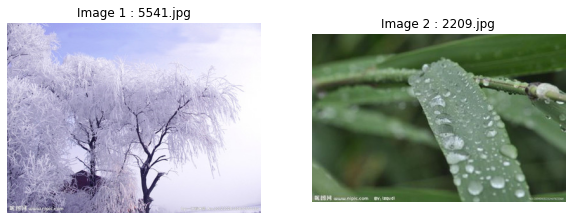

In [77]:
idx1 = 5000
idx2 = 1
visualize_images(idx1, idx2, file_info)

Min a: 1.0	Max a: 1164.0
Min b: 0.0	Max b: 693.25


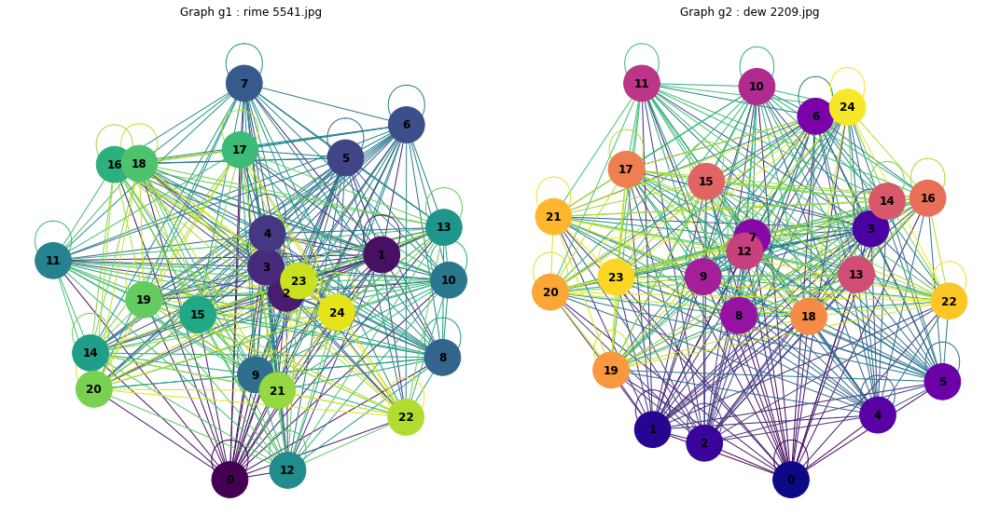

In [78]:
a = adjacency_matrices[idx1] 
b = adjacency_matrices[idx2]

print(f"Min a: {a.min()}\tMax a: {a.max()}")
print(f"Min b: {b.min()}\tMax b: {b.max()}")

# remove some edges
# a = np.where(a < 50, 0, a)
# b = np.where(b < 50, 0, b)

# print(file_info[idx1])
# print(file_info[idx2])

g1 = nx.from_numpy_array(a)
g2 = nx.from_numpy_array(b)

name_1 = ' '.join(file_info[idx1]["file_path"].split("/")[-2:])
name_2 = ' '.join(file_info[idx2]["file_path"].split("/")[-2:])
visualize_graphs(g1, g2, name_1, name_2)

In [79]:
similarity_score = nx.graph_edit_distance(g1, g2, node_subst_cost = node_subst_cost, edge_subst_cost = edge_subst_cost, timeout=10)
print(f"GED: {similarity_score}")

GED: 300.0


In [80]:
print(f"Is Isomorphic : {nx.is_isomorphic(g1, g2)}") # no weights considered

Is Isomorphic : False


In [81]:
if np.array_equal(a, b):
    print("Arrays are equal")
else:
    print("Arrays are not equal")

Arrays are not equal


In [82]:
graph1 = adjacency_matrices[idx1] 
graph2 = adjacency_matrices[idx2]

print(f"min g1: {np.min(graph1)}\tmax g1: {np.max(graph1)}")
print(f"min g2: {np.min(graph2)}\tmax g2: {np.max(graph2)}")

# Calculating single cost matrix
cost_matrix = np.zeros((graph1.shape[0], graph2.shape[0]))
for i in range(graph1.shape[0]):
    for j in range(graph2.shape[0]):
        cost_matrix[i][j] = np.linalg.norm(graph1[i] - graph2[j])  # Example cost function (Euclidean distance)

        
min_val = np.min(cost_matrix)
max_val = np.max(cost_matrix)
cost_matrix = (cost_matrix - min_val) / (max_val - min_val)
row_ind, col_ind = linear_sum_assignment(cost_matrix)

# Print the optimal assignment
print("Optimal Assignment:")
for i in range(len(row_ind)):
    print(f"Node {row_ind[i]} in Graph 1 -> (is matched with) Node {col_ind[i]} in Graph 2 with (Cost: {cost_matrix[row_ind[i], col_ind[i]]})")
    
# Calculate the total cost of the optimal assignment
total_cost = cost_matrix[row_ind, col_ind].sum()

# Compute the average similarity score
num_matches = len(row_ind)
average_similarity_score = total_cost / num_matches

print("Average Similarity Score:", average_similarity_score)

min g1: 1.0	max g1: 1164.0
min g2: 0.0	max g2: 693.25
Optimal Assignment:
Node 0 in Graph 1 -> (is matched with) Node 24 in Graph 2 with (Cost: 0.36824223892482716)
Node 1 in Graph 1 -> (is matched with) Node 10 in Graph 2 with (Cost: 0.6361704433286167)
Node 2 in Graph 1 -> (is matched with) Node 7 in Graph 2 with (Cost: 0.6601807579709108)
Node 3 in Graph 1 -> (is matched with) Node 19 in Graph 2 with (Cost: 0.6367774123573985)
Node 4 in Graph 1 -> (is matched with) Node 15 in Graph 2 with (Cost: 0.6917432730156016)
Node 5 in Graph 1 -> (is matched with) Node 11 in Graph 2 with (Cost: 0.5555237888377348)
Node 6 in Graph 1 -> (is matched with) Node 14 in Graph 2 with (Cost: 0.4115614855310654)
Node 7 in Graph 1 -> (is matched with) Node 17 in Graph 2 with (Cost: 0.2937178032129592)
Node 8 in Graph 1 -> (is matched with) Node 13 in Graph 2 with (Cost: 0.11595572321327227)
Node 9 in Graph 1 -> (is matched with) Node 9 in Graph 2 with (Cost: 0.29580911362519086)
Node 10 in Graph 1 -> (is